## SKINLESIONS DETECTION
##### Charles MONTE - Jeanne MALECOT

### Imports nécessaires

In [1]:
import numpy as np
import platform
import tempfile
import os
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
# necessite scikit-image 
from skimage import data, filters, color, morphology
from skimage import io as skio
from skimage.filters import threshold_otsu

from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin
from sklearn.datasets import load_sample_image
from sklearn.utils import shuffle
from time import time
from skimage.io import imread

import preProcessing as pr
import dullrazor as dr
import utiles as ut
import segmentation as seg

---
---
## PRE PROCESSING

---
### Importation d'une image et conversion vers HSV

In [50]:
im1 = skio.imread('images/ISIC_0000142.jpg')
hsv_im1 = color.rgb2hsv(im1)

im2 = skio.imread('images/ISIC_0000049.jpg')
hsv_im2 = color.rgb2hsv(im2)

im3 = skio.imread('images/ISIC_0000042.jpg')
hsv_im3 = color.rgb2hsv(im3)

im4 = skio.imread('images/ISIC_0000030.jpg')
hsv_im4 = color.rgb2hsv(im4)

### Création du set de pixels S

In [51]:
S1 = pr.S(hsv_im1)
S2 = pr.S(hsv_im2)
S3 = pr.S(hsv_im3)
S4 = pr.S(hsv_im4)

### Création de la nouvelle image

In [52]:
new_im1 = pr.newIm(hsv_im1,S1)
new_im2 = pr.newIm(hsv_im2,S2)
new_im3 = pr.newIm(hsv_im3,S3)
new_im4 = pr.newIm(hsv_im4,S4)

> Le temps d'éxécution du préprocessing est actuellement en moyenne de 18 secondes, une durée longue mais satisfaisante.

---
### Présentation des résultats

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


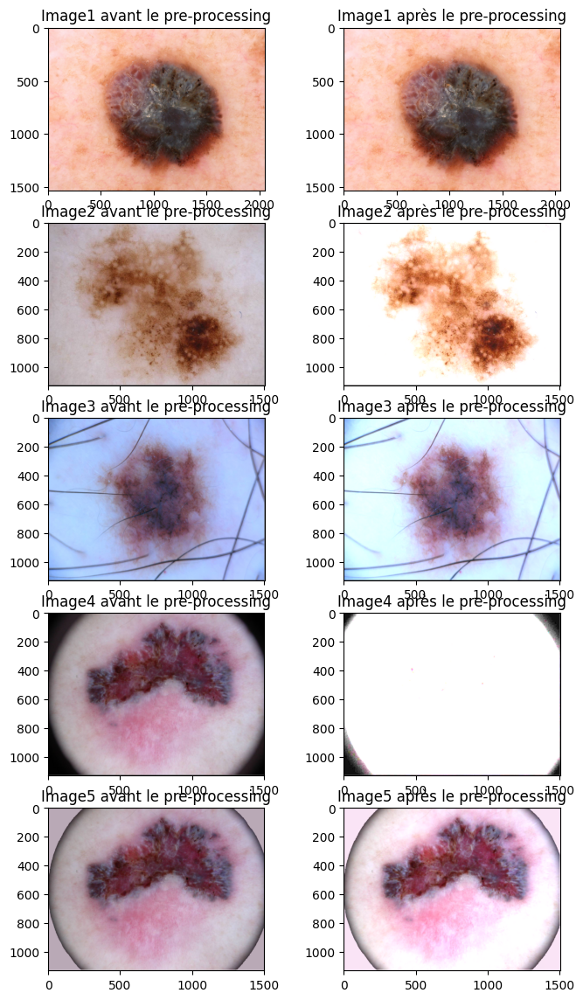

In [53]:
fig=plt.figure(figsize=(8,14))

fig.add_subplot(421).set_title('Image1 avant le pre-processing')
plt.imshow(im1)

fig.add_subplot(422).set_title('Image1 après le pre-processing')
plt.imshow(new_im1)

fig.add_subplot(423).set_title('Image2 avant le pre-processing')
plt.imshow(im2)

fig.add_subplot(424).set_title('Image2 après le pre-processing')
plt.imshow(new_im2)

fig.add_subplot(425).set_title('Image3 avant le pre-processing')
plt.imshow(im3)

fig.add_subplot(426).set_title('Image3 après le pre-processing')
plt.imshow(new_im3)

fig.add_subplot(427).set_title('Image4 avant le pre-processing')
plt.imshow(im4)

fig.add_subplot(428).set_title('Image4 après le pre-processing')
plt.imshow(new_im4)



> On remarque que dans la majorité des cas, le pré-processing s'avère efficace voire réellement utile, malgré la présence de poils. Le seul problème est sur des images possédant une vignette vu que l'algorithme se base sur les pixels dans les coins de l'image.

---
### OTSU et premiers tests de segmentation

On peut réaliser un premier test sur ces images traitées, avec une méthode de segmentation simple et connue comme Otsu.

In [54]:
im1_nb = color.rgb2gray(im1)
im2_nb = color.rgb2gray(im2)
im3_nb = color.rgb2gray(im3)
im4_nb = color.rgb2gray(im4)

im1_pp_nb = color.rgb2gray(new_im1)
im2_pp_nb = color.rgb2gray(new_im2)
im3_pp_nb = color.rgb2gray(new_im3)
im4_pp_nb = color.rgb2gray(new_im4)

In [55]:
im1_otsu = im1_nb < threshold_otsu(im1_nb)
im2_otsu = im2_nb < threshold_otsu(im2_nb)
im3_otsu = im3_nb < threshold_otsu(im3_nb)
im4_otsu = im4_nb < threshold_otsu(im4_nb)

im1_pp_otsu = im1_pp_nb < threshold_otsu(im1_pp_nb)
im2_pp_otsu = im2_pp_nb < threshold_otsu(im2_pp_nb)
im3_pp_otsu = im3_pp_nb < threshold_otsu(im3_pp_nb)
im4_pp_otsu = im4_pp_nb < threshold_otsu(im4_pp_nb)

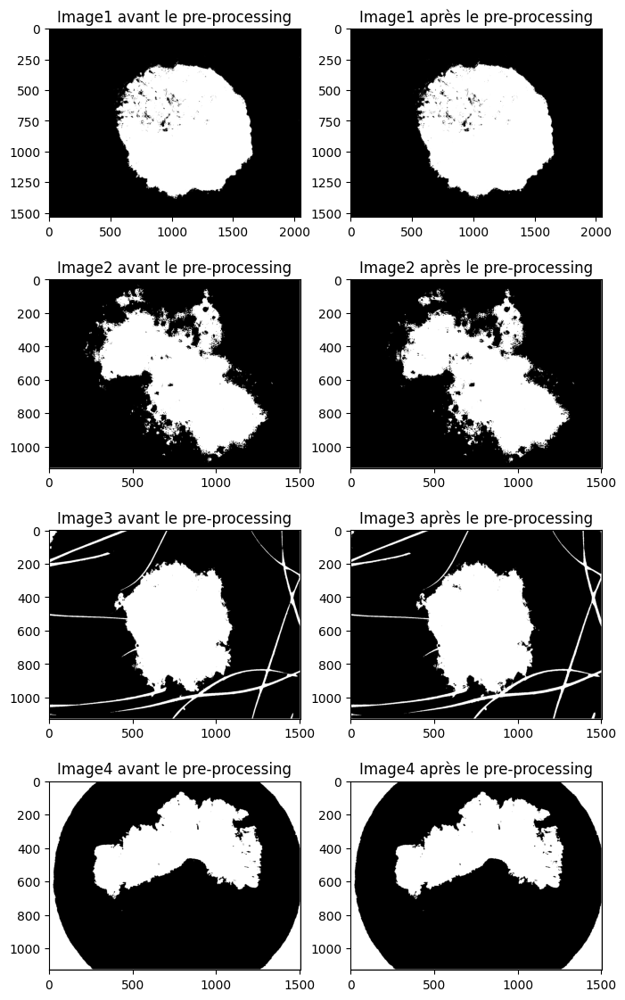

In [56]:
fig=plt.figure(figsize=(8,14))

fig.add_subplot(421).set_title('Image1 avant le pre-processing')
plt.imshow(im1_otsu, cmap="gray")

fig.add_subplot(422).set_title('Image1 après le pre-processing')
plt.imshow(im1_pp_otsu, cmap="gray")

fig.add_subplot(423).set_title('Image2 avant le pre-processing')
plt.imshow(im2_otsu, cmap="gray")

fig.add_subplot(424).set_title('Image2 après le pre-processing')
plt.imshow(im2_pp_otsu, cmap="gray")

fig.add_subplot(425).set_title('Image3 avant le pre-processing')
plt.imshow(im3_otsu, cmap="gray")

fig.add_subplot(426).set_title('Image3 après le pre-processing')
plt.imshow(im3_pp_otsu, cmap="gray")

fig.add_subplot(427).set_title('Image4 avant le pre-processing')
plt.imshow(im4_otsu, cmap="gray")

fig.add_subplot(428).set_title('Image4 après le pre-processing')
plt.imshow(im4_pp_otsu, cmap="gray")

> Les différences sont assez légères entre les images ayant subi un pré-traitement ou non.
La méthode Otsu ne semble toutefois pas adaptée à notre projet, puisque les masques obtenus sont encore très différents de cus de référence, et ce même pour une image ne présentant pas de difficulté (poils, bordure...). 

On peut tout de même s'amuser à calculer le Dice score de ces masques.

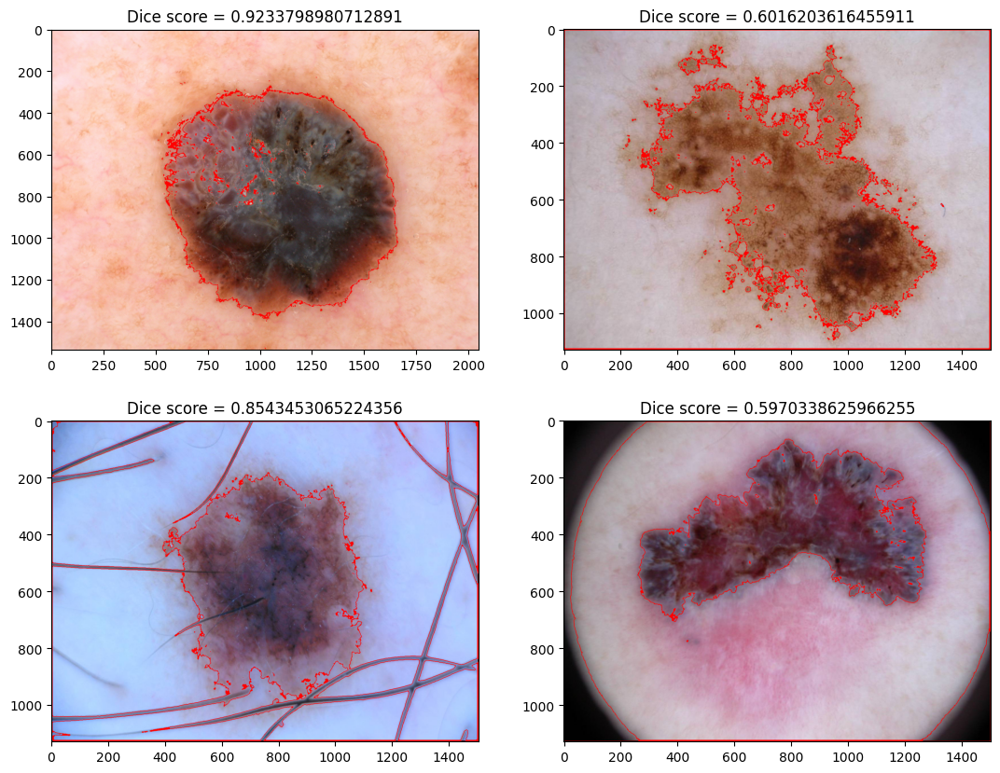

In [57]:
dice_1 = ut.dice_score(im1_pp_otsu, skio.imread('images/ISIC_0000142_Segmentation.png'))
dice_2 = ut.dice_score(im2_pp_otsu, skio.imread('images/ISIC_0000049_Segmentation.png'))
dice_3 = ut.dice_score(im3_pp_otsu, skio.imread('images/ISIC_0000042_Segmentation.png'))
dice_4 = ut.dice_score(im4_pp_otsu, skio.imread('images/ISIC_0000030_Segmentation.png'))

fig=plt.figure(figsize=(13,10))
fig.add_subplot(221).set_title('Dice score = '+ str(dice_1))
plt.imshow(ut.contours(im1, im1_pp_otsu))

fig.add_subplot(222).set_title('Dice score = '+ str(dice_2))
plt.imshow(ut.contours(im2, im2_pp_otsu))

fig.add_subplot(223).set_title('Dice score = '+ str(dice_3))
plt.imshow(ut.contours(im3, im3_pp_otsu))

fig.add_subplot(224).set_title('Dice score = '+ str(dice_4))
plt.imshow(ut.contours(im4, im4_pp_otsu))

plt.show()

> On constate qu'à part sur une image quasiment idéale, le dice score est assez faible.  
Il sera donc indispensable d'implémenter une des méthodes de segmentation proposées dans les papiers, qui devrait être plus adaptée à ce que nous recherchons, et pour laquelle le pre-processing aura une plus grande utilité.
Aussi, la troisième image met en évidence le problème posé par les poils. Il est donc indispensable d'ajouter un procédé de "hair removal" à la phase de pré-processing.

---
---
## Hair Removal avec Dull Razor

---
### Chargement et visualisation d'une image

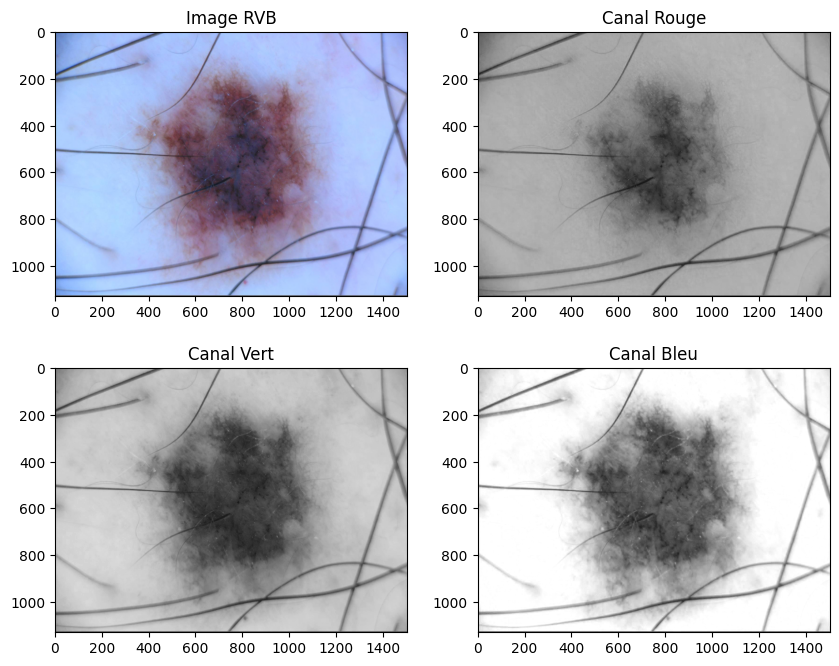

In [6]:
ima = skio.imread('images/ISIC_0000042.jpg')
ut.view_can(ima)

> On a d'abord essayé de visualiser les 3 canaux sur l'image qui nous a semblée la plus simple à traiter.
On constate que le canal bleu offre une image très contrastée, où les poils plus longs et épais seront surement plus faciles à détecter, tandis que le canal rouge permet de très bien distinguer le poil qui se trouve au milieu de la lésion par exemple.  
La création du masque binaire s'appuera de toute façon sur les 3 versions de l'image.

### Création des masques binaires

On suit la méthode du papier afin d'obtenir un premier masque binaire, avec seulement trois directions dans un premier temps. 

In [59]:
masque_b = dr.masque_b_3dir(ima,250)

On peut essayer créer le masque pour l'image après avoir appliqué le pre-processing.

In [60]:
ima_hsv = color.rgb2hsv(ima)
s_matrix = pr.S(ima_hsv)
ima_pp = pr.newIm(ima_hsv,s_matrix)

In [61]:
masque_b_pp = 1-dr.masque_b_3dir(ima_pp,0.2)

---
### Présentation des masques

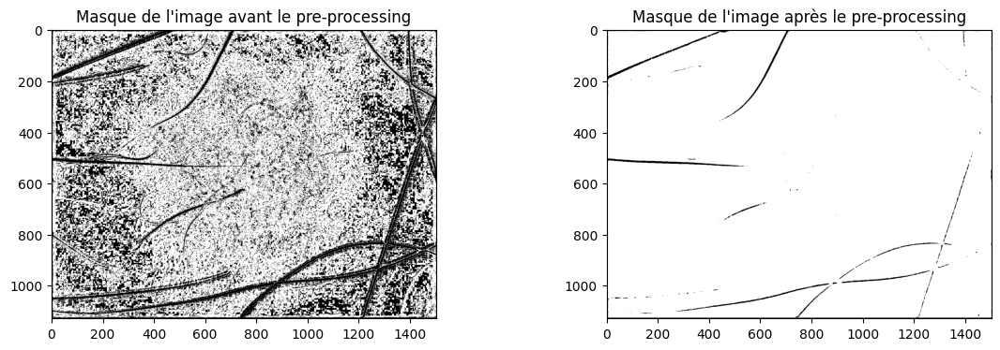

In [62]:
fig=plt.figure(figsize=(14,4))

fig.add_subplot(121).set_title("Masque de l'image avant le pre-processing")
plt.imshow(masque_b, cmap='gray')

fig.add_subplot(122).set_title("Masque de l'image après le pre-processing")
plt.imshow(masque_b_pp, cmap='gray')

> Le masque obtenu après le traitement n'est pas convaincant : il semble plus pertinent de commencer par l'étape de _hair removal_ dans le procédé final.

On pourrait essayer de réduire le bruit sur l'image n'ayant pas subi de pré-traitement en augmentant le nombre de directions pour les éléments structurants utilisés pour créer le masque.

In [7]:
masque_b_5 = dr.masque_b_5dir(ima,250)

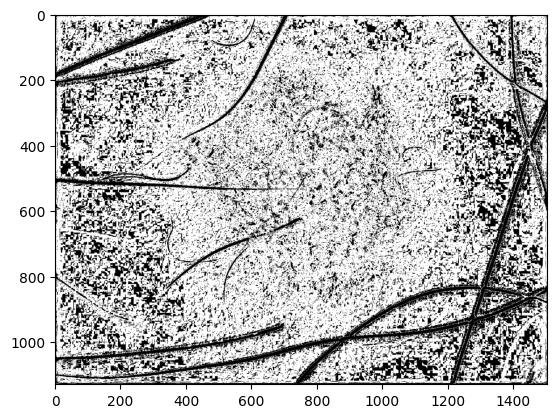

In [8]:
plt.imshow(masque_b_5, cmap="gray")
plt.show()

> Le résultat semble en effet moins bruité que le masque précédent, et les poils semblent plus uniformes.
Pour améliorer ce masque, on se propose d'implémenter la suite de la méthode proposée par le papier Dull Razor.

#### Nettoyage des masques

On essaye maintenant de "nettoyer" ce masque à l'aide des opérations morphologiques de base à notre disposition.  
L'utilisation du _white tophat_ permet de supprimer les éléments trop petits, assimilables à du bruit. On utilise aussi des _opening_ qui permettent d'avoir des traits plus continus, et donc des poils complets. 

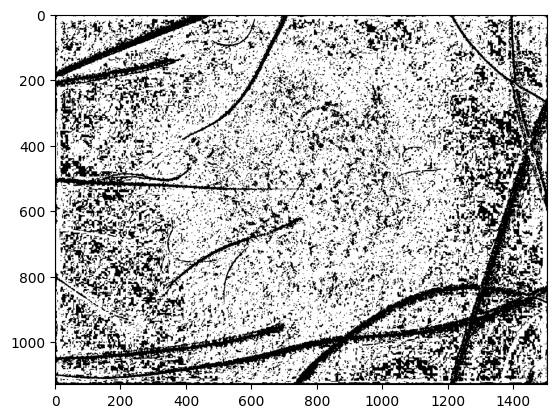

In [9]:
masque_clean_1 = morphology.binary_opening(masque_b_5, morphology.square(2))
top_hat = 1-morphology.white_tophat((1-masque_clean_1), morphology.square(2))
masque_clean_1 = masque_clean_1-top_hat
masque_clean_1 = 1-morphology.binary_opening(masque_clean_1, morphology.square(2))
plt.imshow(masque_clean_1, cmap="gray")

> Le masque obtenu semble bel et bien plus propre, sans donner l'impression d'avoir perdu en informations essentielles. Les paramètres des transformations morphologiques ont été choisies empiriquement, le carré semblant être un paramètre suffisamment basqiue pour s'adapter à plusieurs images.

On se propose maintenant d'essayer la méthode suggérée dans le papier de recherche _Dull Razor_, sur le masque d'origine ainsi que sur celui préalablement nettoyé. La fonction de nettoyage est implémentée directement dans le fichier _dullrazor.py_.

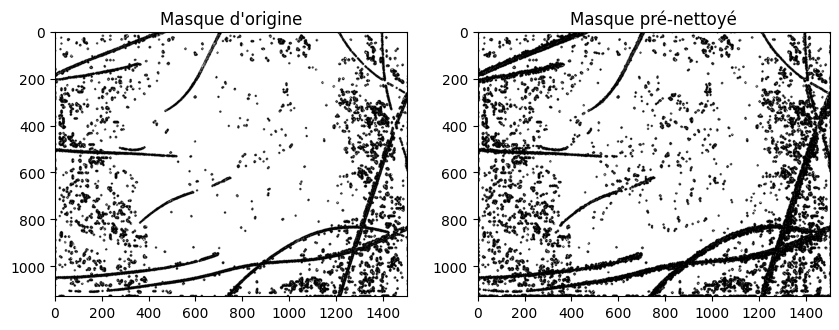

In [10]:
masque_clean_2 = dr.masque_cleaning(masque_b_5)
masque_clean_3 = dr.masque_cleaning(masque_clean_1)

fig = plt.figure(figsize=(10,16))

fig.add_subplot(121).set_title("Masque d'origine")
plt.imshow(masque_clean_2, cmap="gray")

fig.add_subplot(122).set_title("Masque pré-nettoyé")
plt.imshow(masque_clean_3, cmap="gray")

> La différence est très légère ; le double nettoyage semble plus efficace mais on pourra eventuellement tester les deux lors de la segmentation.

Il est ensuite pertinent de réaliser quelques opérations de morphologie sur le masque obtenu, afin de prendre en compte les ombres des poils lors du traitement de l'image. En appliquant un procédé d'érosion au masque, les zones noires, donc les poils, seront étendues. Les zones de bruits restantes seront aussi étendues, d'où l'utilité de réaliser cette opération après avoir nettoyé un maximum le masque.  
De plus, le fait de traiter des pixels correspondant à de la peau comme des pixels correspondant à des poils ne pose pas tant de problèmes puisque l'opération consistera à leur attribuer une couleur de peau saine.

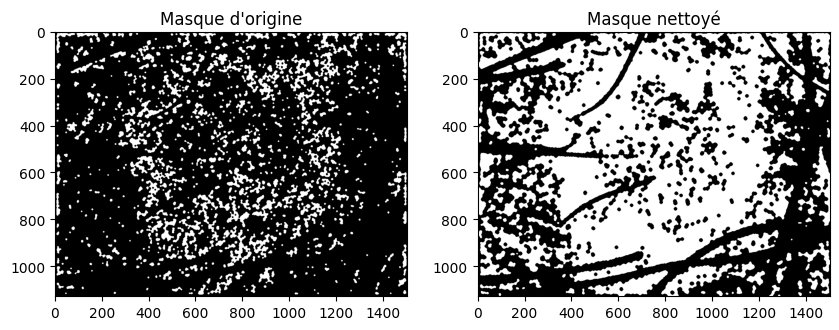

In [67]:
masque_ombres_1 = morphology.opening(masque_clean_1, morphology.star(5))
masque_ombres_1 = morphology.erosion(masque_ombres_1, morphology.disk(3))

masque_ombres_2 = morphology.opening(masque_clean_3, morphology.star(5))
masque_ombres_2 = morphology.erosion(masque_ombres_2, morphology.disk(3))

fig = plt.figure(figsize=(10,16))

fig.add_subplot(121).set_title("Masque d'origine")
plt.imshow(masque_ombres_1, cmap="gray")

fig.add_subplot(122).set_title("Masque nettoyé")
plt.imshow(masque_ombres_2, cmap="gray")

> On voit bien qu'il était indispensable de nettoyer le masque avant de procéder à l'érosion. Sans cela, le masque devient en effet inutilisable.

### Hair removal

On peut finalement passer à l'étape de traitement de l'image pour retirer les poils. Notre fonction *hair_removal* prend en argument _rad_ qui défini la taille de la zone observée autour de chaque pixel pour faire une moyenne. On peut réaliser des tests avec différentes valeurs afin de déterminer la plus satisfaisante.

c:\Users\jeann\Documents\Cours Télécom\2A\IMA_PROJET\projet-charles\ima201-skinlesions-malecotmonte\Rapport\dullrazor.py:173: RuntimeWarning: invalid value encountered in long_scalars
  ima[i, j, 0] = zone_r.sum()/pm_size  # r mean
c:\Users\jeann\Documents\Cours Télécom\2A\IMA_PROJET\projet-charles\ima201-skinlesions-malecotmonte\Rapport\dullrazor.py:174: RuntimeWarning: invalid value encountered in long_scalars
  ima[i, j, 1] = zone_v.sum()/pm_size  # v mean
c:\Users\jeann\Documents\Cours Télécom\2A\IMA_PROJET\projet-charles\ima201-skinlesions-malecotmonte\Rapport\dullrazor.py:175: RuntimeWarning: invalid value encountered in long_scalars
  ima[i, j, 2] = zone_b.sum()/pm_size  # b mean


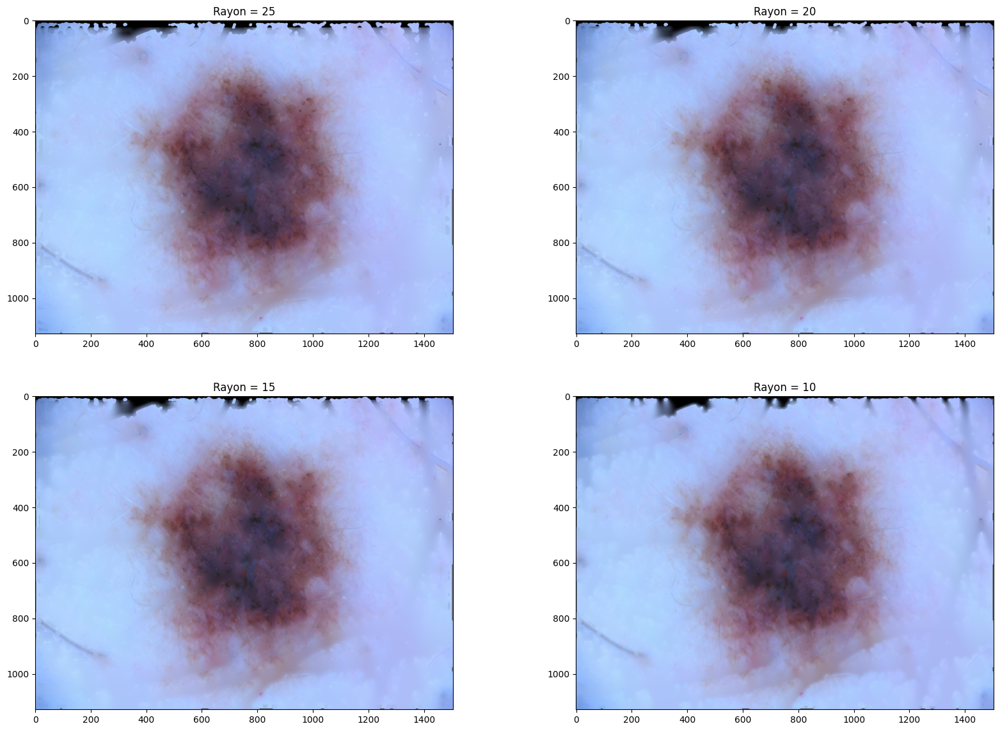

In [68]:
fig = plt.figure(figsize=(20,14))
ima_dr_1 = ima.copy() #on applique la fonction hair removal sur une copie de l'image
dr.hair_removal(ima_dr_1,masque_ombres_2,25)
fig.add_subplot(221).set_title("Rayon = 25")
plt.imshow(ima_dr_1)

ima_dr_2 = ima.copy() 
dr.hair_removal(ima_dr_2,masque_ombres_2,20)
fig.add_subplot(222).set_title("Rayon = 20")
plt.imshow(ima_dr_2)

ima_dr_3 = ima.copy()
dr.hair_removal(ima_dr_3,masque_ombres_2,15)
fig.add_subplot(223).set_title("Rayon = 15")
plt.imshow(ima_dr_3)

ima_dr_4 = ima.copy() 
dr.hair_removal(ima_dr_4,masque_ombres_2,10)
fig.add_subplot(224).set_title("Rayon = 10")
plt.imshow(ima_dr_4)

>Le rayon de 25 donne un résultat plus satisfaisant, mais a en contrepartie un temps d'exécution beaucoup plus long.  
On note aussi dans tous les cas une zone ou le masque apparait, par manque de pixels n'appartenant pas au masque dans la zone des pixels traités en haut.  
Ce problème pourrait être résolu lors des autres phases de pré-processing. On fait donc le choix de garder ce résultat, quitte à y revenir après avoir implémenté toutes les étapes.

---
### Présentation des résultats

L'ensemble des observations effectuées ci-dessus nous permettent d'implémenter la fonction *dull_razor*, qui rassemble toutes les étapes. On peut ainsi tester simplement notre programme sur plusieurs images, y compris celles qui ne présentent pas de poils, ou bien des vignettes par exemple.

In [18]:
im1 = skio.imread('images/ISIC_0000142.jpg')
im2 = skio.imread('images/ISIC_0000049.jpg')
im3 = skio.imread('images/ISIC_0000042.jpg')
im4 = skio.imread('images/ISIC_0000030.jpg')

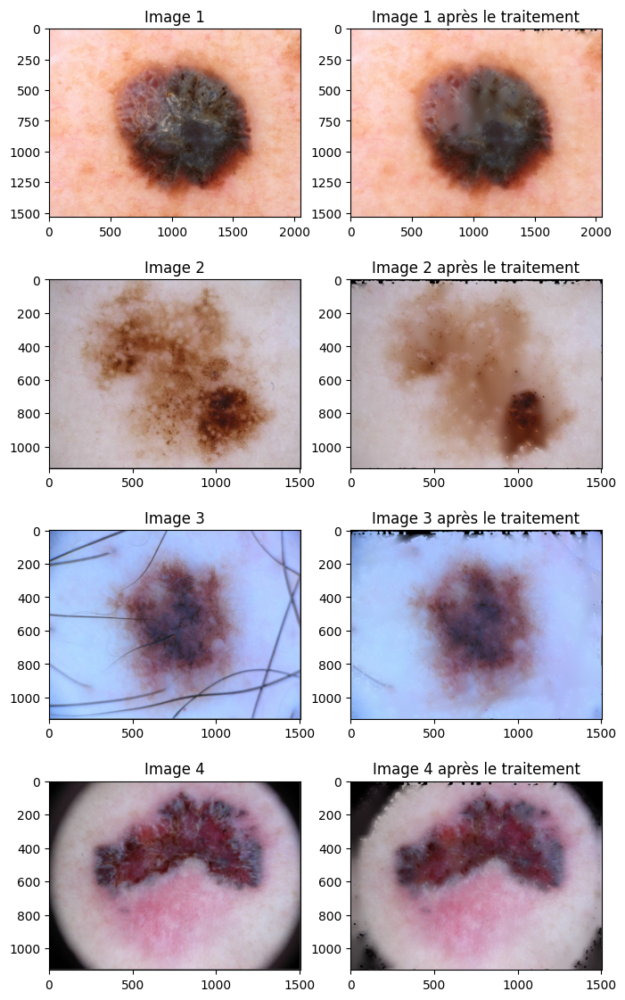

In [70]:
fig=plt.figure(figsize=(8,14))

fig.add_subplot(421).set_title('Image 1')
plt.imshow(im1)

fig.add_subplot(422).set_title('Image 1 après le traitement')
plt.imshow(dr.dull_razor(im1))

fig.add_subplot(423).set_title('Image 2')
plt.imshow(im2)

fig.add_subplot(424).set_title('Image 2 après le traitement')
plt.imshow(dr.dull_razor(im2))

fig.add_subplot(425).set_title('Image 3')
plt.imshow(im3)

fig.add_subplot(426).set_title('Image 3 après le traitement')
plt.imshow(dr.dull_razor(im3))

fig.add_subplot(427).set_title('Image 4')
plt.imshow(im4)

fig.add_subplot(428).set_title('Image 4 après le traitement')
plt.imshow(dr.dull_razor(im4))

> On remarque pour les images sans poils que le traitement fait perdre des informations à l'image, en particulier pour l'image 2. 
On pourrait alors imaginer un critère de sélection, qui permettrait au programme de détecter si un masque correspond à une image avec des poils ou non.

In [19]:
masque_clean_im2 = dr.masque_cleaning(dr.masque_b_5dir(im2,250))

#le black-tophat permet de ne conserver que les éléments noirs plus petit que l'élément structurant.
#On peut ainsi nettoyer fortement l'image en l'aditionnant au black_tophat, en choisissant comme élément un disque de rayon 5 qui se rapproche du bruit sur les masques.
#Cette opération ne peut pas être réalisée systématiquement, car dans le cas ou l'image présente des poils, trop d'informations sont perdues.
masque_tophat = masque_clean_im2 + morphology.black_tophat(masque_clean_im2, morphology.disk(5))

#On peut mesurer la quantité de pixels noirs restant sur l'image après addition avec le tophat, afin d'obtenir une valeur empirique qui permettra de déterminer si des poils étaient biens visibles.
print((1-masque_tophat).sum())

3371


> On obtient une valeur dont on ne sait pas trop quoi faire. On peut essayer d'obtenir la valeur correspondante pour une image avec poils.

In [6]:
masque_clean_im3 = dr.masque_cleaning(dr.masque_b_5dir(im3,250))

masque_tophat = masque_clean_im3 + morphology.black_tophat(masque_clean_im3, morphology.disk(5))

print((1-masque_tophat).sum())

167336


> Il vaut mieux faire des essais avec une valeur plus proche de la première (en ajoutant tout de même une certaine marge) puisqu'il vaut mieux traiter une image sans poils que ne pas traiter une image qui en a.

On se propose donc désormais d'implémenter un version "intelligente" de Dull-Razor qui ne traite que les images avec des poils.

In [3]:
im1 = skio.imread('images/ISIC_0000142.jpg')
im2 = skio.imread('images/ISIC_0000049.jpg')
im3 = skio.imread('images/ISIC_0000042.jpg')
im4 = skio.imread('images/ISIC_0000030.jpg')

c:\Users\jeann\Documents\Cours Télécom\2A\IMA_PROJET\projet-charles\ima201-skinlesions-malecotmonte\Rapport\dullrazor.py:173: RuntimeWarning: invalid value encountered in long_scalars
  ima[i, j, 0] = zone_r.sum()/pm_size  # r mean
c:\Users\jeann\Documents\Cours Télécom\2A\IMA_PROJET\projet-charles\ima201-skinlesions-malecotmonte\Rapport\dullrazor.py:174: RuntimeWarning: invalid value encountered in long_scalars
  ima[i, j, 1] = zone_v.sum()/pm_size  # v mean
c:\Users\jeann\Documents\Cours Télécom\2A\IMA_PROJET\projet-charles\ima201-skinlesions-malecotmonte\Rapport\dullrazor.py:175: RuntimeWarning: invalid value encountered in long_scalars
  ima[i, j, 2] = zone_b.sum()/pm_size  # b mean


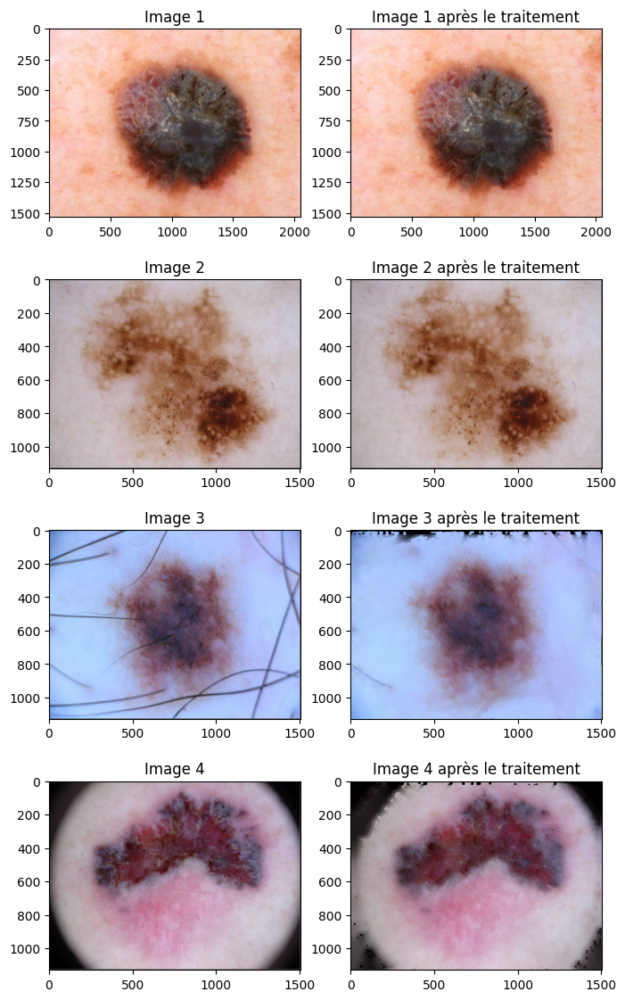

In [4]:
fig=plt.figure(figsize=(8,14))

fig.add_subplot(421).set_title('Image 1')
plt.imshow(im1)

fig.add_subplot(422).set_title('Image 1 après le traitement')
plt.imshow(dr.smart_dull_razor(im1))

fig.add_subplot(423).set_title('Image 2')
plt.imshow(im2)

fig.add_subplot(424).set_title('Image 2 après le traitement')
plt.imshow(dr.smart_dull_razor(im2))

fig.add_subplot(425).set_title('Image 3')
plt.imshow(im3)

fig.add_subplot(426).set_title('Image 3 après le traitement')
plt.imshow(dr.smart_dull_razor(im3))

fig.add_subplot(427).set_title('Image 4')
plt.imshow(im4)

fig.add_subplot(428).set_title('Image 4 après le traitement')
plt.imshow(dr.smart_dull_razor(im4))

> Avec cette nouvelle version, les images sans poils ne sont pas traitées ;  
On remarque aussi qu'il sera plus pertinent d'enlever la vignette à l'µimage 4 avant le hair removal.

---
---
## SEGMENTATION
---
### Enlèvement de la vignette

>On a remarqué que la vignette pouvait poser problème, elle en posera aussi lors de la phase de segmentation, c'est pourquoi la retirer en la remplaçant par une couleur proche de la peau saine est utile.
Comme décrite dans le papier [3], cette couleur proche de la peau saine a été obtenue en prenant la médiane d'un rectangle de peau saine, opération décrite plus bas.
On reprend ensuite les mêmes opérations de pré-processing faites précedemment mais cette fois sur l'image sans vignette.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


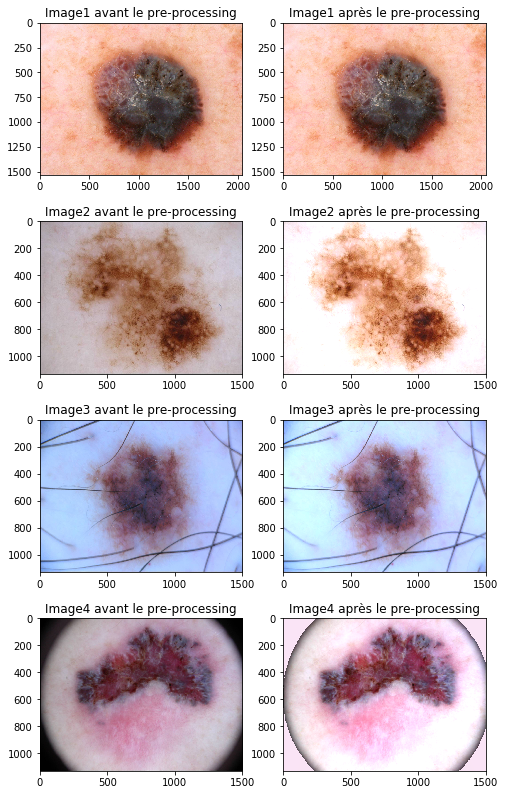

In [2]:
im1 = skio.imread('images/ISIC_0000142.jpg')
im11 = seg.remplacement_vignette(im1,seg.bords_noirs(im1),seg.peau_saine(im1))
hsv_im1 = color.rgb2hsv(im11)

im2 = skio.imread('images/ISIC_0000049.jpg')
im21 = seg.remplacement_vignette(im2,seg.bords_noirs(im2),seg.peau_saine(im2))
hsv_im2 = color.rgb2hsv(im21)

im3 = skio.imread('images/ISIC_0000042.jpg')
im31 = seg.remplacement_vignette(im3,seg.bords_noirs(im3),seg.peau_saine(im3))
hsv_im3 = color.rgb2hsv(im31)

im4 = skio.imread('images/ISIC_0000030.jpg')
im41 = seg.remplacement_vignette(im4,seg.bords_noirs(im4),seg.peau_saine(im4))
hsv_im4 = color.rgb2hsv(im41)

S1 = pr.S(hsv_im1)
S2 = pr.S(hsv_im2)
S3 = pr.S(hsv_im3)
S4 = pr.S(hsv_im4)

new_im1 = pr.newIm(hsv_im1,S1)
new_im2 = pr.newIm(hsv_im2,S2)
new_im3 = pr.newIm(hsv_im3,S3)
new_im4 = pr.newIm(hsv_im4,S4)

fig=plt.figure(figsize=(8,14))

fig.add_subplot(421).set_title('Image1 avant le pre-processing')
plt.imshow(im1)

fig.add_subplot(422).set_title('Image1 après le pre-processing')
plt.imshow(new_im1)

fig.add_subplot(423).set_title('Image2 avant le pre-processing')
plt.imshow(im2)

fig.add_subplot(424).set_title('Image2 après le pre-processing')
plt.imshow(new_im2)

fig.add_subplot(425).set_title('Image3 avant le pre-processing')
plt.imshow(im3)

fig.add_subplot(426).set_title('Image3 après le pre-processing')
plt.imshow(new_im3)

fig.add_subplot(427).set_title('Image4 avant le pre-processing')
plt.imshow(im4)

fig.add_subplot(428).set_title('Image4 après le pre-processing')
plt.imshow(new_im4)

>On remarque que le pré-processing est cette fois efficace sur la 4ème image

---
### Obtention d'une image d'intensité

>Il nous faut maintenant une image donnant l'écart entre la couleur du pixel et celle de la peau saine afin de faire ressortir les lésions. Pour cela, on va suivre la méthode du papier [3] et chercher à avoir une zone définie comme un rectangle d'épaisseur définie ne contenant que des pixels de peau avec la variance la plus basse possible, ce qui indiquera qu'elle contient le plus de peau saine possible. Ensuite, on prend la médiane de cette zone et on obtient l'image d'intensité en calculant la distance euclidienne de l'image de base à cette médiane.

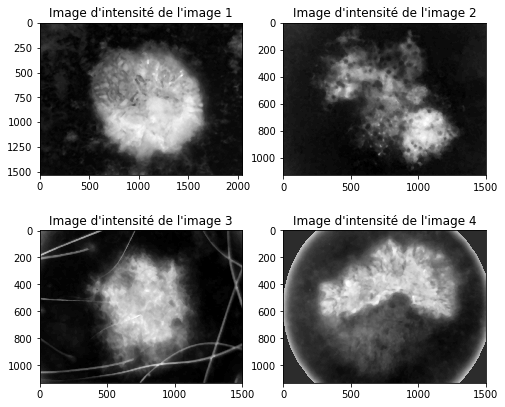

In [7]:
img_int1 = seg.image_intensite(new_im1,im11)
img_int2 = seg.image_intensite(new_im2,im21)
img_int3 = seg.image_intensite(new_im3,im31)
img_int4 = seg.image_intensite(new_im4,im41)

fig=plt.figure(figsize=(8,7))

fig.add_subplot(221).set_title('Image d\'intensité de l\'image 1')
plt.imshow(img_int1,cmap='gray')

fig.add_subplot(222).set_title('Image d\'intensité de l\'image 2')
plt.imshow(img_int2,cmap='gray')

fig.add_subplot(223).set_title('Image d\'intensité de l\'image 3')
plt.imshow(img_int3,cmap='gray')

fig.add_subplot(224).set_title('Image d\'intensité de l\'image 4')
plt.imshow(img_int4,cmap='gray')


>Sauf pour l'image 3 qui contient des poils, on remarque que l'image d'intensité fait apparaître très clairement les lésions et non le reste. L'auréole laissée par l'enlèvement de la vignette n'est pas dérangeant car très facilement retirable avec des opérations de morphologie.

---
### Calcul de l'image segmentée

>Comme expliqué dans le papier [3], on va chercher à adapter la selection du seuil dans l'algorithme d'Otsu afin qu'il soit plus adapté à la détection du mélanome   
>Les paramètres alpha et beta permettent de jouer sur le choix du seuil et donc de prendre une zone plus ou moins grande. Il serait intéressant d'optimiser le choix de leur valeur mais le temps de calcul serait beaucoup trop long.

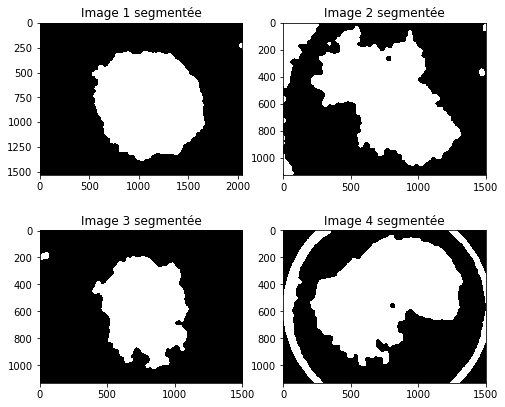

In [18]:
img_thresh1 = seg.im_thresh(new_im1,img_int1,0.15,0.1)
img_thresh2 = seg.im_thresh(new_im2,img_int2,0.05,0.1)
img_thresh3 = seg.im_thresh(new_im3,img_int3,0.2,0.1)
img_thresh4 = seg.im_thresh(new_im4,img_int4,0.15,0.1)

fig=plt.figure(figsize=(8,7))

fig.add_subplot(221).set_title('Image 1 segmentée')
plt.imshow(img_thresh1,cmap='gray')

fig.add_subplot(222).set_title('Image 2 segmentée')
plt.imshow(img_thresh2,cmap='gray')

fig.add_subplot(223).set_title('Image 3 segmentée')
plt.imshow(img_thresh3,cmap='gray')

fig.add_subplot(224).set_title('Image 4 segmentée')
plt.imshow(img_thresh4,cmap='gray')


>Le masque est satisfaisant mais encore rempli d'artefacts, notamment le halo de l'image 4 et les trous à l'intérieur des lésions segmentées. Il faut donc passer par une étape de post-processing.

---
### Post-processing

>On a donc appliqué les étapes de post-processing décrites dans le papier [3].

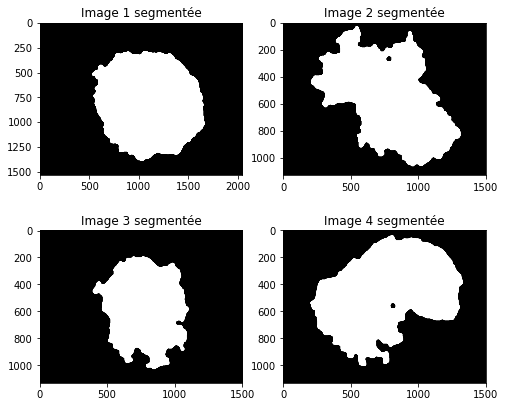

In [19]:
lesion_img1 = seg.post_processing(img_thresh1,img_int1)
lesion_img2 = seg.post_processing(img_thresh2,img_int2)
lesion_img3 = seg.post_processing(img_thresh3,img_int3)
lesion_img4 = seg.post_processing(img_thresh4,img_int4)

fig=plt.figure(figsize=(8,7))

fig.add_subplot(221).set_title('Image 1 segmentée')
plt.imshow(lesion_img1,cmap='gray')

fig.add_subplot(222).set_title('Image 2 segmentée')
plt.imshow(lesion_img2,cmap='gray')

fig.add_subplot(223).set_title('Image 3 segmentée')
plt.imshow(lesion_img3,cmap='gray')

fig.add_subplot(224).set_title('Image 4 segmentée')
plt.imshow(lesion_img4,cmap='gray')

>Il nous reste maintenant à calculer le dice score pour ces nouvelles segmentations obtenues.

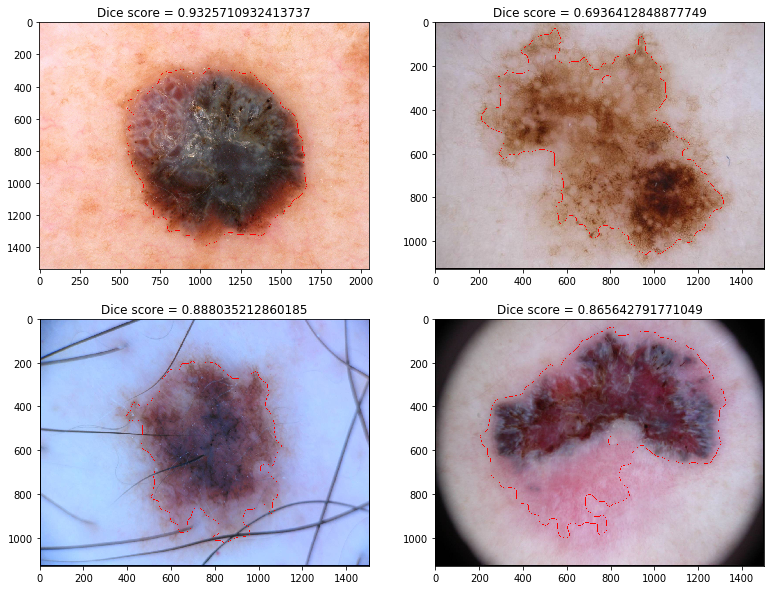

In [20]:
dice_1 = ut.dice_score(lesion_img1.astype(int), skio.imread('images/ISIC_0000142_Segmentation.png'))
dice_2 = ut.dice_score(lesion_img2.astype(int), skio.imread('images/ISIC_0000049_Segmentation.png'))
dice_3 = ut.dice_score(lesion_img3.astype(int), skio.imread('images/ISIC_0000042_Segmentation.png'))
dice_4 = ut.dice_score(lesion_img4.astype(int), skio.imread('images/ISIC_0000030_Segmentation.png'))

fig=plt.figure(figsize=(13,10))
fig.add_subplot(221).set_title('Dice score = '+ str(dice_1))
plt.imshow(ut.contours(im1, lesion_img1.astype(int)))

fig.add_subplot(222).set_title('Dice score = '+ str(dice_2))
plt.imshow(ut.contours(im2, lesion_img2.astype(int)))

fig.add_subplot(223).set_title('Dice score = '+ str(dice_3))
plt.imshow(ut.contours(im3, lesion_img3.astype(int)))

fig.add_subplot(224).set_title('Dice score = '+ str(dice_4))
plt.imshow(ut.contours(im4, lesion_img4.astype(int)))

plt.show()

>On remarque une augmentation du dice score sur toutes les images, voire même une augmentation significative, notamment pour la 2ème et surtout la 4ème image. Le dice score peut d'ailleurs encore être augmenté avec un choix encore plus judicieux de alpha et beta.

---
---
# PROCÉDÉ FINAL
---
---

Il suffit d'éxécuter les fonctions décrites plus haut dans cet ordre :
Retirage de la vignette -> DullRazor -> Pre-Processing -> Segmentation -> Post-Processing -> Calcul du Dice Score

Concernant DullRazor, nous avons remarqué que l'appliquer sur des images dont nous avons retiré la vignette causait de mauvais résultats, nous avons donc décidé de ne pas l'appliquer dans ce cas là.

In [20]:
def procede_final(img_name,alpha,beta):

    img = skio.imread('images/'+img_name+'.jpg')
    masque = skio.imread('images/'+img_name+'_Segmentation.png')

    bordsNoirs = seg.bords_noirs(img)

    img1 = seg.remplacement_vignette(img,bordsNoirs,seg.peau_saine(img))
    if(np.max(seg.bords_noirs(img)) == 0):
        img1_dr = dr.smart_dull_razor(img1)
        hsv_img = color.rgb2hsv(img1_dr)
    else : 
        hsv_img = color.rgb2hsv(img1)
    S1 = pr.S(hsv_img)
    pre_proc = pr.newIm(hsv_img,S1)
    img_seg = seg.segmentation_finale(pre_proc,alpha,beta)

    dice = ut.dice_score(img_seg.astype(int), masque)

    fig=plt.figure(figsize=(14,6))
    plt.title('Dice score = '+ str(dice))
    
    fig.add_subplot(121)
    plt.imshow(ut.contours(img, img_seg.astype(int)))

    fig.add_subplot(122)
    plt.imshow(img_seg, cmap='gray')
    plt.show()

Nous avons ensuite choisi manuellement pour chaque image des valeurs de alpha optimales pour obtenir la meilleure segmentation possible. Les valeurs restent toujours en moyenne assez faibles (en dessous de 0.3) et toutes en dessous de 0.5.
Voilà la présentation des résultats :

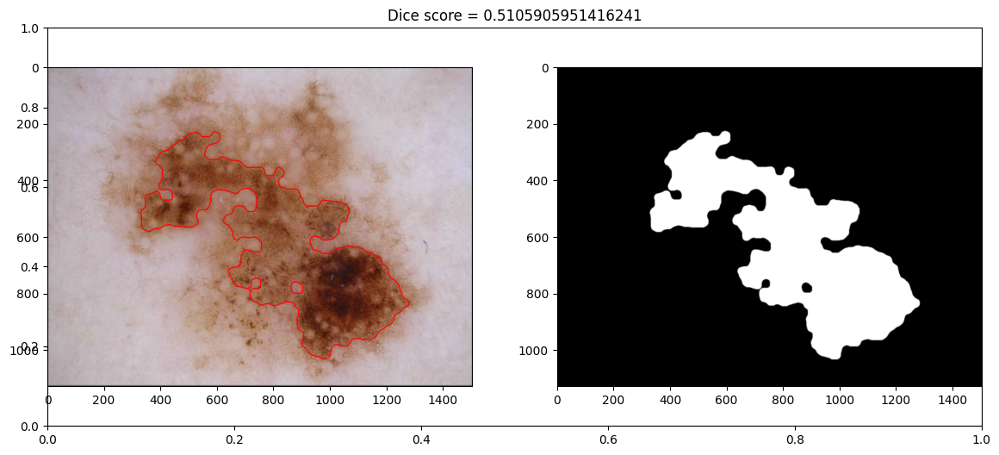

In [26]:
images = ['ISIC_0000000','ISIC_0000001','ISIC_0000008','ISIC_0000019','ISIC_0000024','ISIC_0000030','ISIC_0000042','ISIC_0000045','ISIC_0000046','ISIC_0000049','ISIC_0000080', 'ISIC_0000095','ISIC_0000112','ISIC_0000140','ISIC_0000142','ISIC_0000143','ISIC_0000145','ISIC_0000146','ISIC_0000150','ISIC_0000151']
alphas = [0.1, 0.4, 0.25, 0.1, 0.03 ,0.02, 0.1, 0.15, 0, 0.05, 0.2, 0.2, 0.05, 0.1, 0.15, 0.1, 0.3, 0.05, 0.1, 0.1]

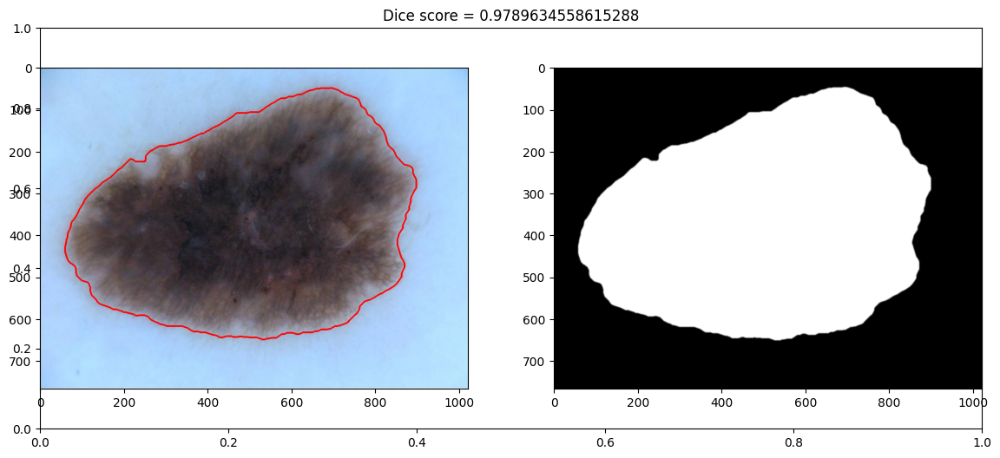

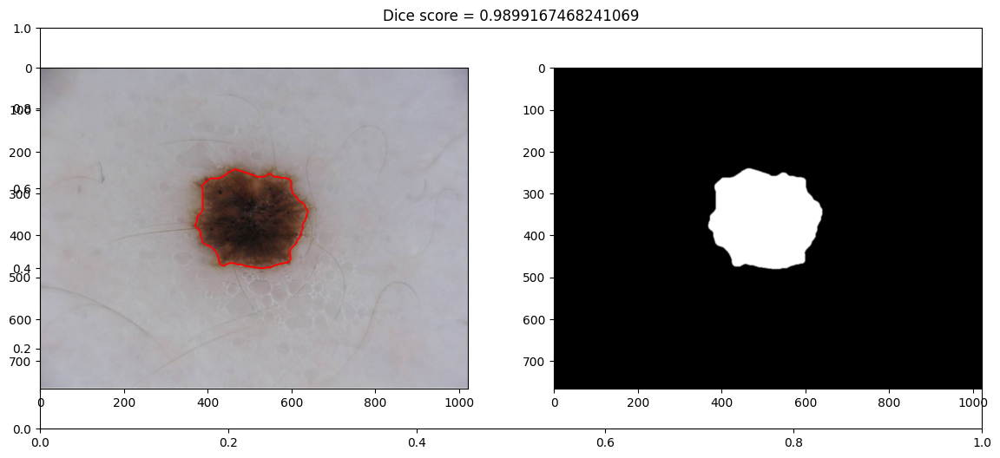

c:\Users\jeann\Documents\Cours Télécom\2A\IMA_PROJET\projet-charles\ima201-skinlesions-malecotmonte\Rapport\dullrazor.py:173: RuntimeWarning: invalid value encountered in long_scalars
  ima[i, j, 0] = zone_r.sum()/pm_size  # r mean
c:\Users\jeann\Documents\Cours Télécom\2A\IMA_PROJET\projet-charles\ima201-skinlesions-malecotmonte\Rapport\dullrazor.py:174: RuntimeWarning: invalid value encountered in long_scalars
  ima[i, j, 1] = zone_v.sum()/pm_size  # v mean
c:\Users\jeann\Documents\Cours Télécom\2A\IMA_PROJET\projet-charles\ima201-skinlesions-malecotmonte\Rapport\dullrazor.py:175: RuntimeWarning: invalid value encountered in long_scalars
  ima[i, j, 2] = zone_b.sum()/pm_size  # b mean


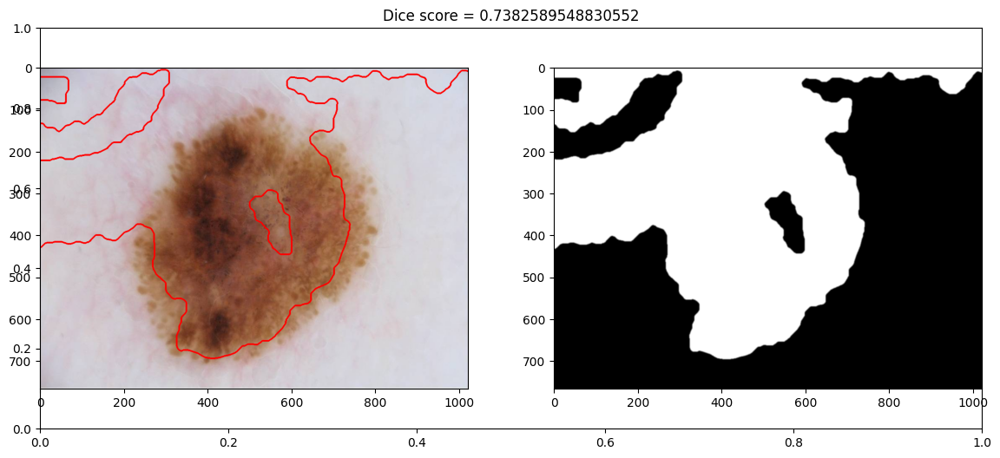

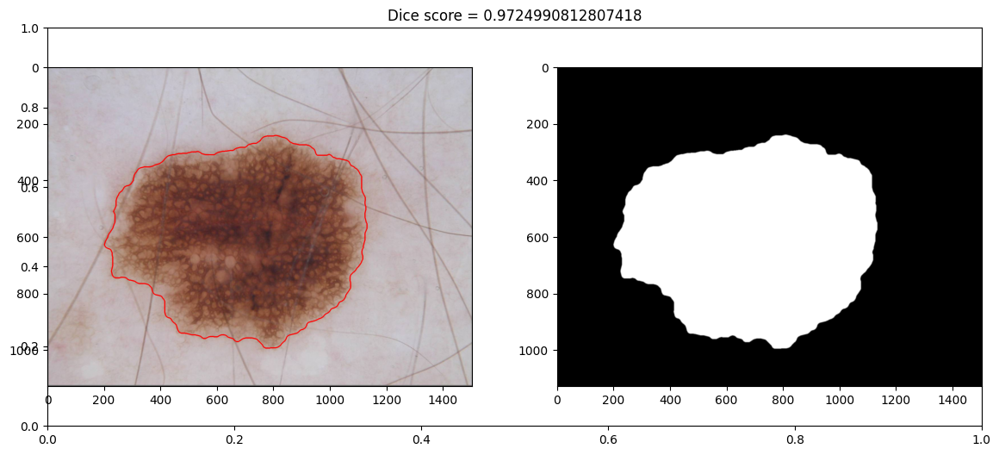

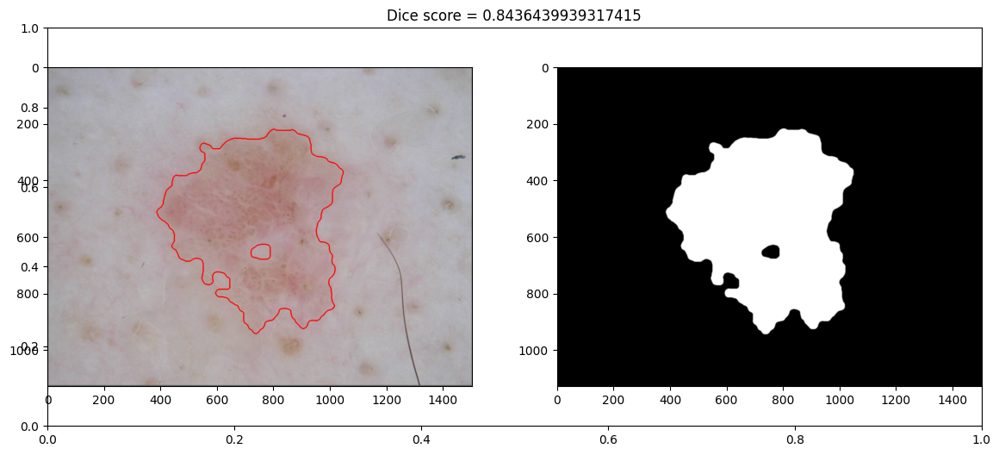

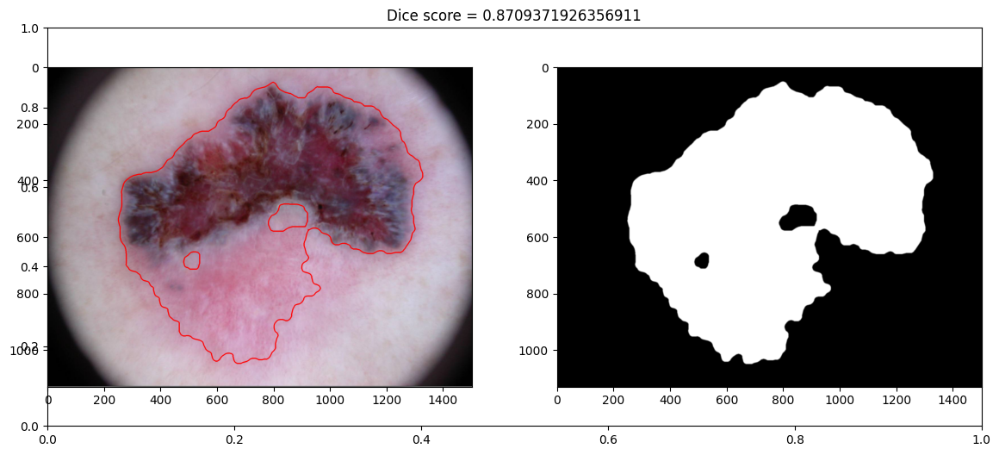

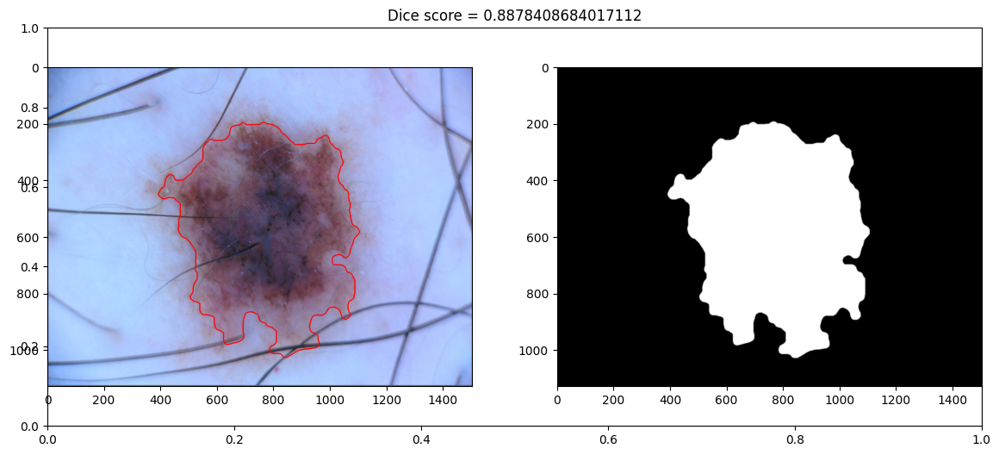

...

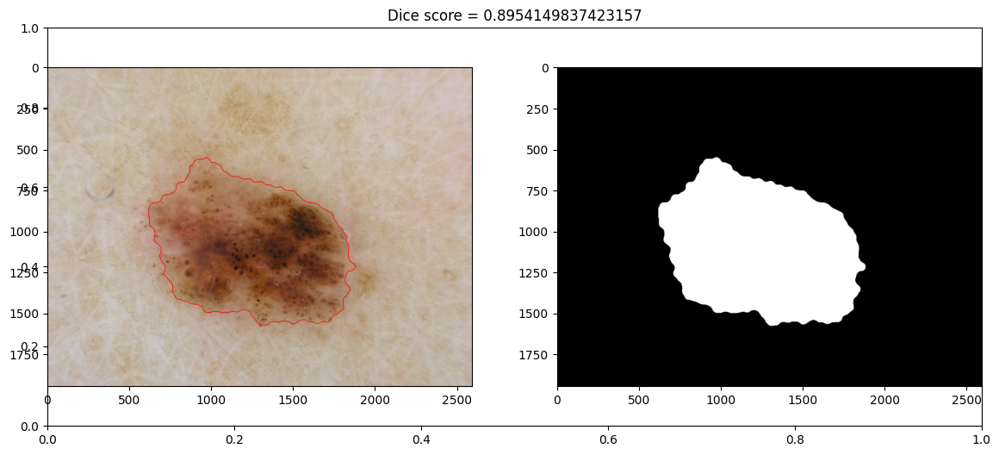

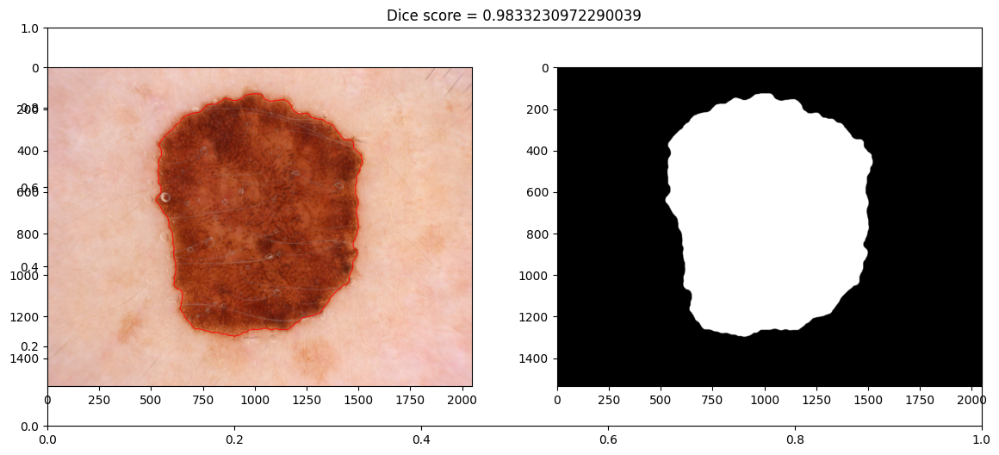

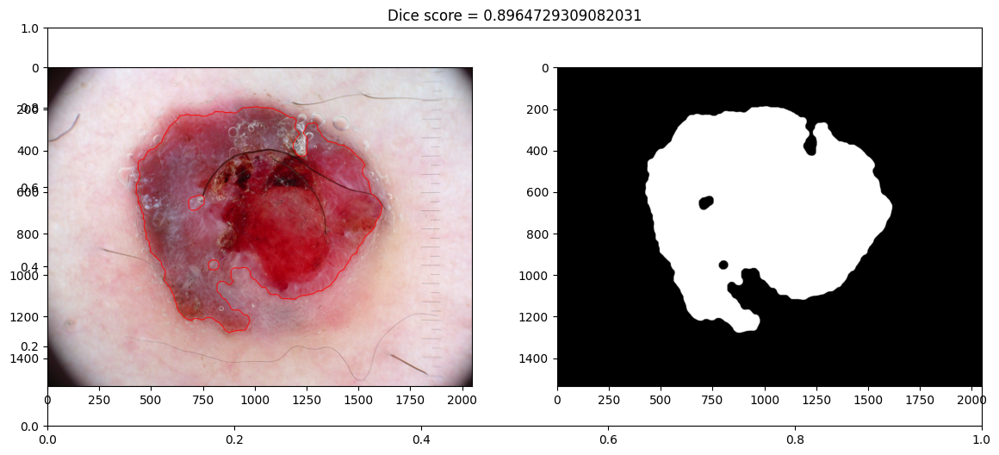

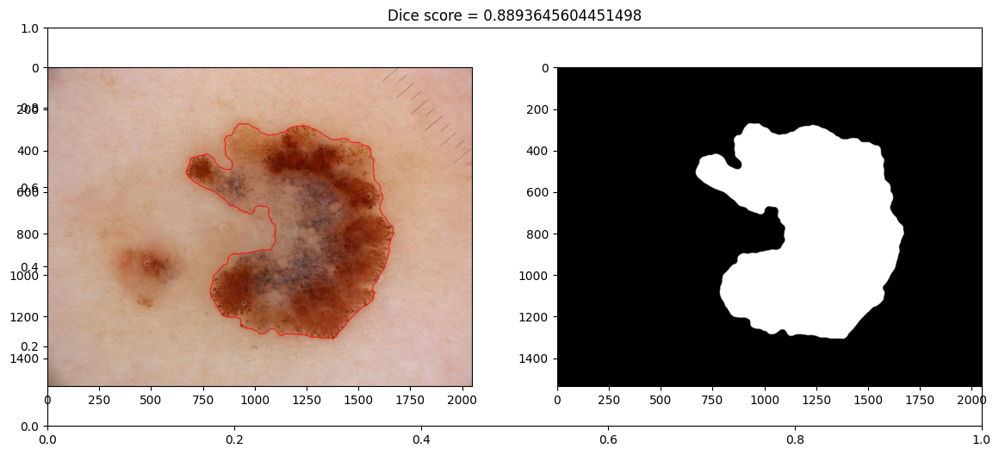

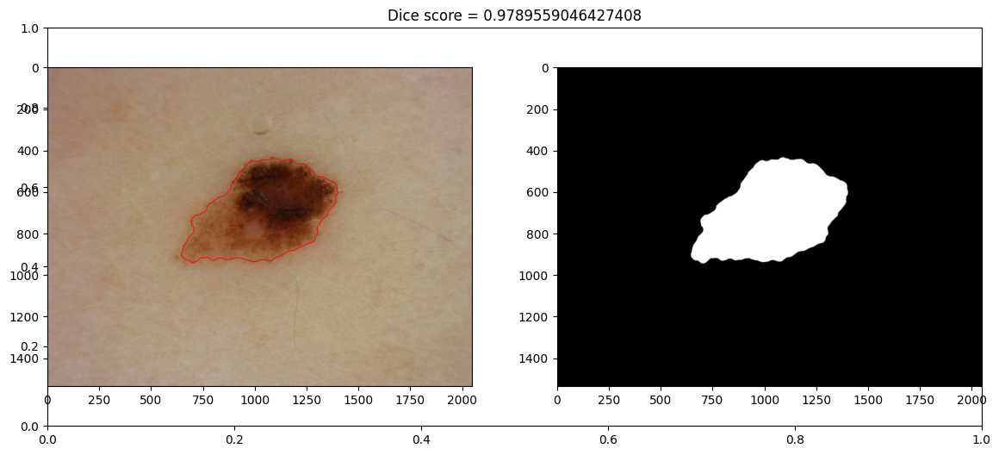

In [27]:
for i in range (len(images)):
    if(i==9):
        procede_final(images[i], alphas[i],0.1)
    else :
        procede_final(images[i], alphas[i],1)

La banque d'image est plus grande que pour les tests faits avec Otsu au début mais le résultat reste le même : on constate des DICE Score élevés, avec une grande majorité au dessus de 0.8. Par rapport à Otsu, le dice score a été augmenté de :   
- **+0%** pour la 1ère image testée   
- **-15%** pour la 2ème image testée   
- **+4,7%** pour la 3ème image testée   
- **+45%** pour la 4ème image testée   

On constate tout de même certains echecs de la méthode de segmentation, notamment dans le cas de la 2ème image.

---
---
# BILAN
---
---

En général, la nouvelle méthode a grandement amélioré la détection des liaisons cutanées. Cependant, celle-ci reste limitée sur certains points :
- Elle a elle aussi du mal à détecter les liaisons d'une couleur proche de la peau saine (avec un dice score parfois proche de 0.5)
- Les facteurs alpha et beta sont difficiles à optimiser et à harmoniser. Comme il est visible plus haut, quasiment aucune image n'a le même facteur alpha optimal. De plus, la durée d'éxécution de l'algorithme rend difficile la recherche optimale de ce couple de paramètres qui a un réel effet sur la segmentation.
- La détection des poils reste en opposition assez forte avec l'enlèvement de la vignette, ce qui pose un réel problème vu qu'une des deux fonctions ne peut pas être appliquée sur une des images. Le problème résidant dans l'auréole sombre restante malgré l'enlèvement de la vignette, il faudrait réfléchir à une amélioration de cette dernière. 
- L'évaluation de nos masques se fait via le dice score, qui est une méthode assez fiable mais toutefois pas comparable à un oeil humain. Pour des mêmes valeurs de dice scores, on a pu obtenir des masques plus ou moins satisfaisants.  

Dans l'ensemble, malgré quelques problèmes d'optimisation, la détection est bien plus efficace que par des manières classiques et donne des résultats très satisfaisants comme vu plus haut, ce qui justifie l'emploi de telles méthodes.

---
---
# REFERENCES
---
---

[1] Shading attenuation in human skin color images, Cavalcanti, Scharcanski, B.O. Lopes

[2] DullRazor : A software approach to hair removal from images, Lee, Ng, Gallagher, Coldman, McLean   

[3] A simple weighted thresholding method for the segmentation of pigmented skin lesions in macroscopic images, Zortea, Flores, Scharcanski   